# Problema de clasificacion

## EDA

In [9]:
%matplotlib inline
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import helper

In [10]:
data = np.load('Data/train_images.npy')
labels = pd.read_csv('Data/train_labels.csv')

clases = ['T-shirt', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

Se muestran algunas instancias de cada clase, notando que clases como T-shirt, shirt y pullover son muy similares entre si, mientras que otras difieren de forma mas notable.

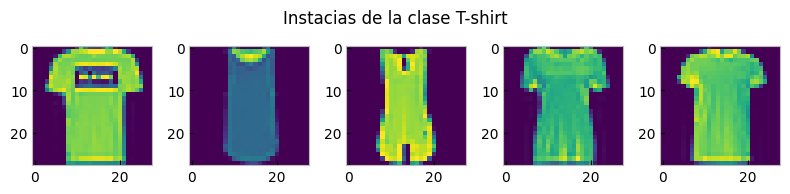

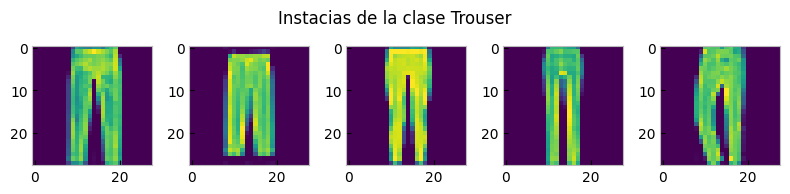

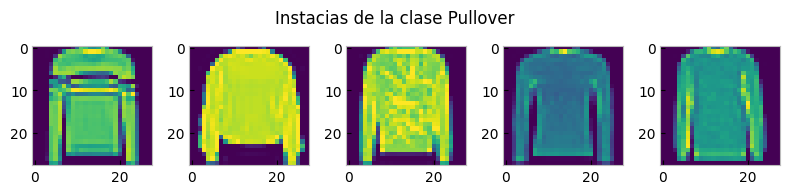

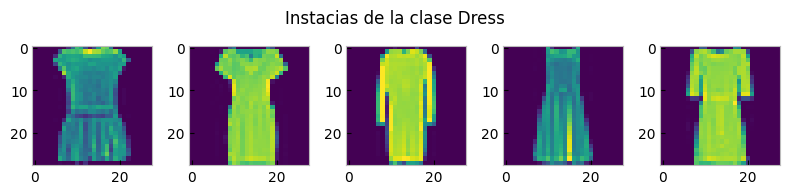

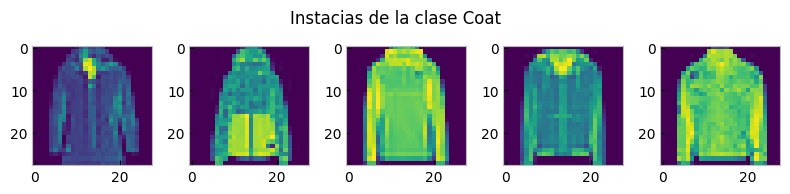

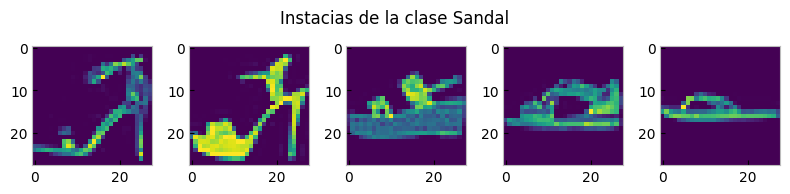

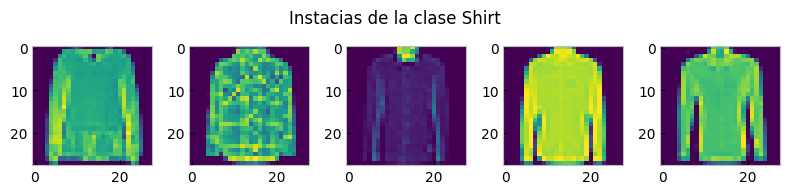

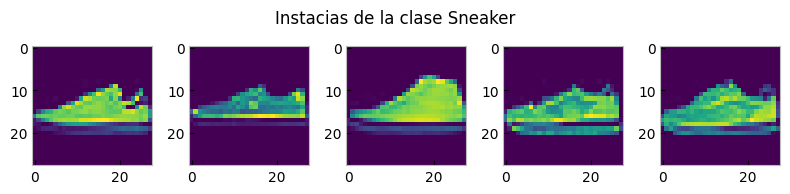

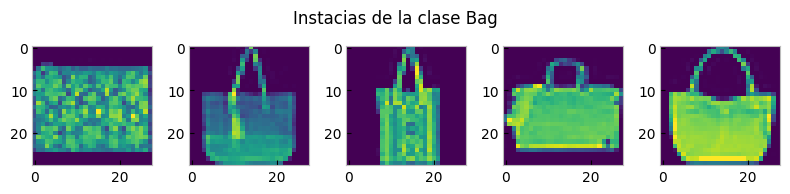

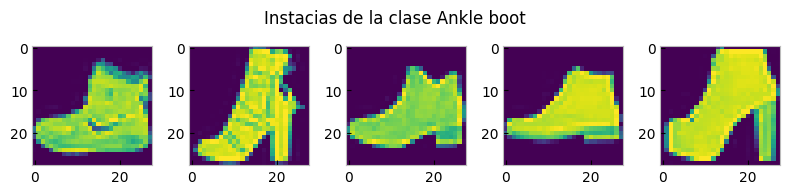

In [11]:
helper.plotInstances(data, labels, clases)

Mirando los histogramas de cada clase notamos que en todos los casos las matrices de entrada son muy esparsas.

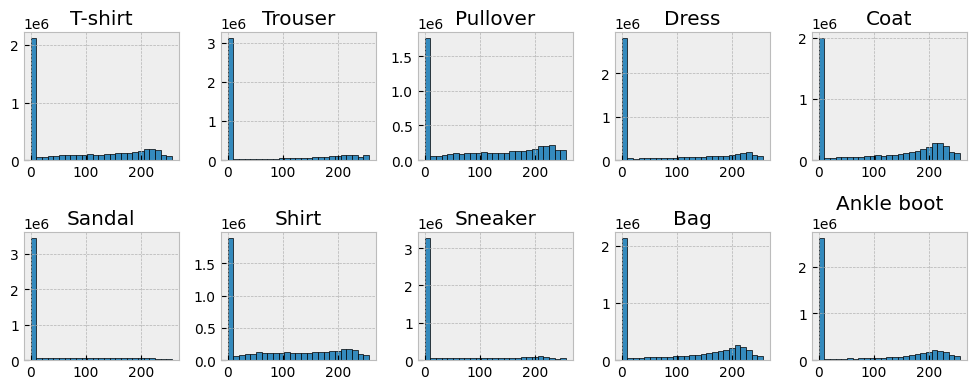

In [12]:
helper.plotHist(data, labels, clases)

Se vizualizan las imagenes promedio de cada clase.

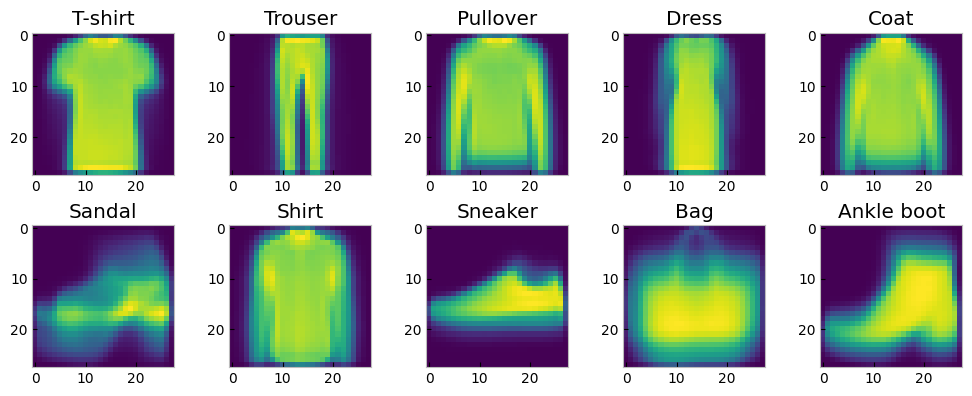

In [13]:
helper.plotAverages(data, labels, clases)

## Modelos:

Se plantearan modelos de clasificacion. Primero softmax y luego MLP. Al final del documento se encuentran los resultados de varios entrenamientos hechos con distintos modelos de clasificacion.

In [7]:
from sklearn.model_selection import train_test_split
import tensorflow as tf

Se separan los datos y las clases se codifican como vectores one-hot.

In [8]:
labelsNp = labels['label'].to_numpy()

trainX, testX, trainY, testY = train_test_split(data, labelsNp, test_size=0.25, random_state=42)

sparseTrainY = tf.one_hot(trainY, 10)

sparseTestY = tf.one_hot(testY, 10)
    
trainX = trainX.astype(np.float32)/255
testX = testX.astype(np.float32)/255

Se importan todas las funciones necesarias para probar distintos modelos de clasificacion tanto softmax como MLP.

In [14]:
from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, LeakyReLU, Dropout, Input
from tensorflow.keras.optimizers import SGD, Adam, Nadam, Adamax, Adagrad
from tensorflow.keras.models import Sequential, load_model, Model
from tensorflow.keras.metrics import Precision, Recall, AUC
from sklearn.metrics import f1_score, roc_auc_score, roc_curve, auc
from tensorflow.keras.regularizers import l2, l1
from tensorflow.keras.initializers import GlorotNormal, glorot_uniform, zeros, random_normal, constant
from tensorflow.keras.callbacks import EarlyStopping

### Softmax

In [10]:
softmax = Sequential()

softmax.add(Flatten(input_shape=(28, 28)))
softmax.add(Dense(10, activation='softmax'))

softmax.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 10)                7850      
                                                                 
Total params: 7,850
Trainable params: 7,850
Non-trainable params: 0
_________________________________________________________________


In [11]:
softmax.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.001), metrics=["accuracy", Precision(name='precision'), Recall(name='recall')])
history = softmax.fit(x = trainX, y = sparseTrainY, validation_data = (testX, sparseTestY), epochs = 10, batch_size = 128)

Epoch 1/10
352/352 [==============================] - 2s 4ms/step - loss: 0.7976 - accuracy: 0.7394 - precision: 0.8720 - recall: 0.5619 - val_loss: 0.6009 - val_accuracy: 0.7945 - val_precision: 0.8653 - val_recall: 0.7020
Epoch 2/10
352/352 [==============================] - 1s 2ms/step - loss: 0.5444 - accuracy: 0.8182 - precision: 0.8796 - recall: 0.7377 - val_loss: 0.5197 - val_accuracy: 0.8278 - val_precision: 0.8789 - val_recall: 0.7556
Epoch 3/10
352/352 [==============================] - 1s 3ms/step - loss: 0.4947 - accuracy: 0.8336 - precision: 0.8844 - recall: 0.7727 - val_loss: 0.4863 - val_accuracy: 0.8349 - val_precision: 0.8851 - val_recall: 0.7736
Epoch 4/10
352/352 [==============================] - 1s 3ms/step - loss: 0.4685 - accuracy: 0.8428 - precision: 0.8880 - recall: 0.7900 - val_loss: 0.4696 - val_accuracy: 0.8385 - val_precision: 0.8837 - val_recall: 0.7865
Epoch 5/10
352/352 [==============================] - 1s 3ms/step - loss: 0.4529 - accuracy: 0.8478 - pr

Las metricas de accuracy, presicion y recall ya son visibles durante el entrenamiento.

In [12]:
name = 'base1'
path = 'Modelos/Softmax'

In [13]:
predict = softmax.predict(testX, verbose=0)

In [15]:
areaROC = roc_auc_score(testY, predict, multi_class='ovr', average='macro')
areaROC

0.9851787127634258

Se aclara, tanto para los modelos softmax como para MLP, que los f1-score, las curva ROC y el area debajo de estas, fueron calculados utilizando los promedios macro. 

El promedio macro se calcula tomando los valores de precision y recall de cada clase por separado y luego promediandolos, dandoles a todas las clases el mismo peso, mientras que en el caso del promedio micro, se utilizan valores generales de precision y recall de todo el modelo.

De esta manera, el promedio micro le da menor peso a las clases de las que se contienen menos instancias por lo que un modelo que es muy bueno clasificando una sola clase mayoritaria podria tener muy buenas metricas aunque no sea un buen clasificador de algunas clases minoritarias.

El promedio macro resuelve este problema dandole a cada clase el mismo peso sin importar cuantas instacias se tengan de cada una.

In [14]:
argmaxPredict = np.argmax(predict, axis=1)
f1Macro = f1_score(testY, argmaxPredict, average='macro')
f1Macro

0.8501551283430511

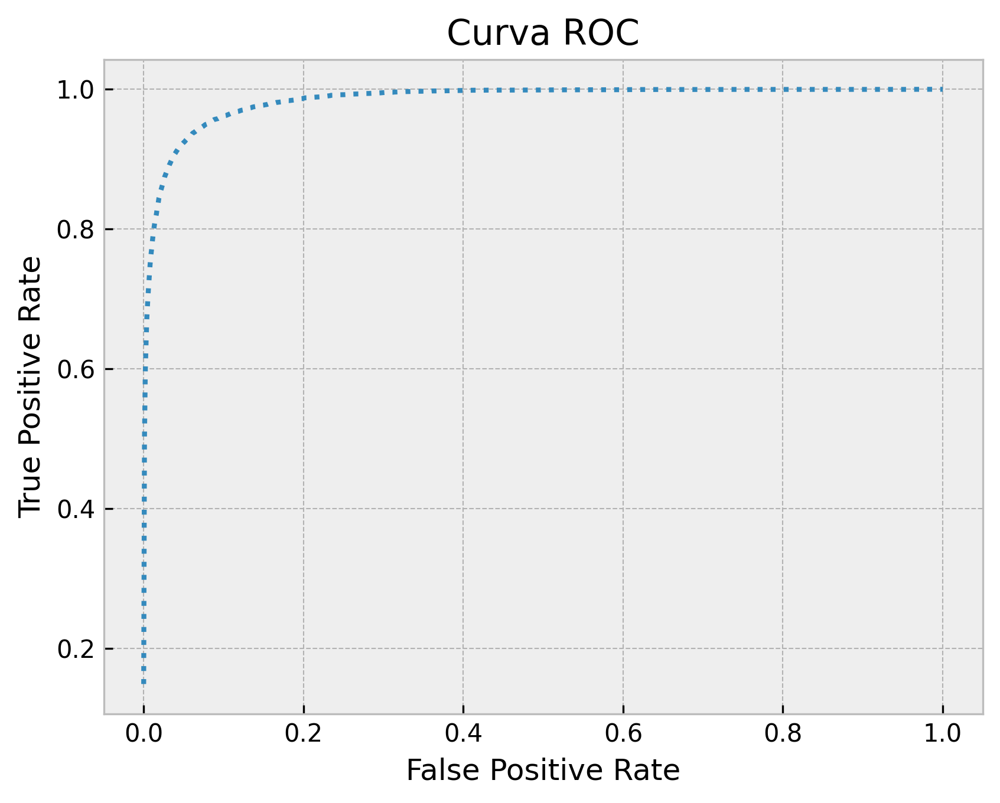

In [16]:
helper.displayAndSaveROC(trainY, testY, predict, path, name)

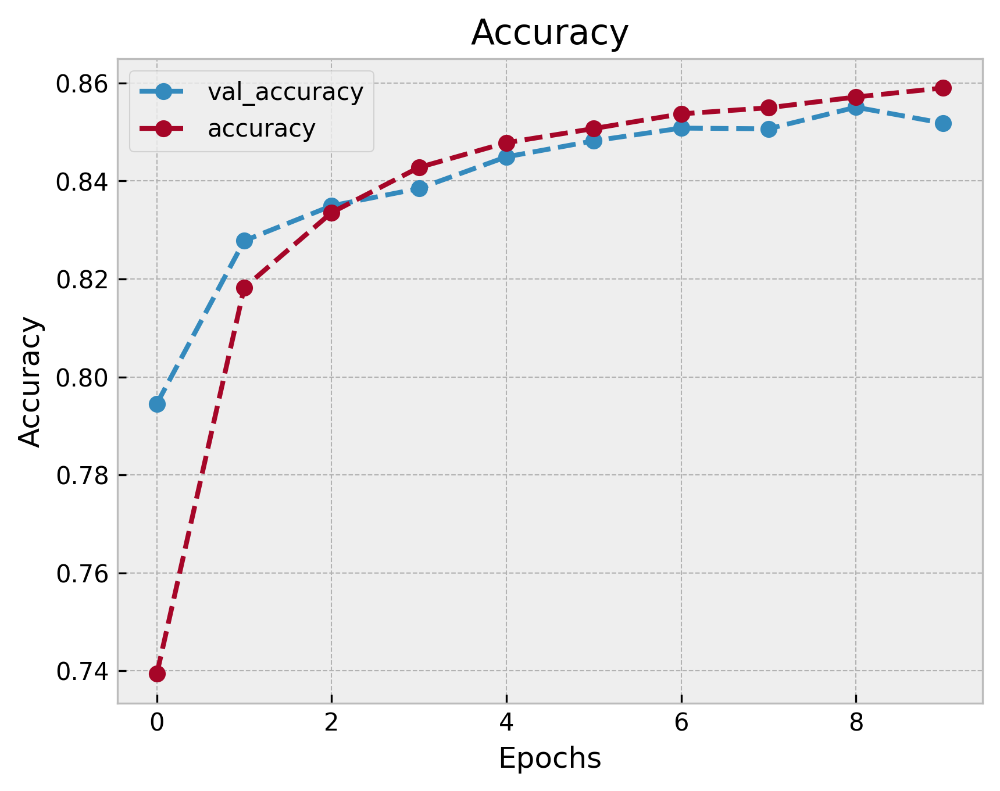

In [17]:
helper.plotAndSaveAcc(history, path, name)

In [18]:
helper.saveData(softmax, f1Macro, areaROC, history, path, name)

### MLP

In [19]:
dropout = 0.3
act = 'relu'

modelMLP = Sequential()
modelMLP.add(Flatten(input_shape=(28, 28)))
modelMLP.add(Dropout(0.3))
modelMLP.add(BatchNormalization(synchronized=True))
modelMLP.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelMLP.add(Dropout(0.3))
modelMLP.add(BatchNormalization(synchronized=True))
modelMLP.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelMLP.add(Dropout(0.3))
modelMLP.add(BatchNormalization(synchronized=True))
modelMLP.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelMLP.add(Dropout(0.3))
modelMLP.add(BatchNormalization(synchronized=True))
modelMLP.add(Dense(2, activation='linear'))
modelMLP.add(Dense(10, activation='softmax', kernel_initializer=GlorotNormal(seed=1)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001)))
modelMLP.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dropout (Dropout)           (None, 784)               0         
                                                                 
 batch_normalization (BatchN  (None, 784)              3136      
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 1000)              785000    
                                                                 
 dropout_1 (Dropout)         (None, 1000)              0         
                                                                 
 batch_normalization_1 (Batc  (None, 1000)             4000      
 hNormalization)                                      

In [20]:
stop = EarlyStopping(monitor='val_accuracy', patience=4, restore_best_weights=True)

batch = 256

modelMLP.compile(loss="categorical_crossentropy", optimizer=Adamax(learning_rate=0.002), metrics=["accuracy", Precision(name='precision'), Recall(name='recall')])

history2 = modelMLP.fit(x = trainX, y = sparseTrainY, validation_data = (testX, sparseTestY), epochs = 10, batch_size = batch, callbacks=[stop], verbose=1)

Epoch 1/10
176/176 [==============================] - 21s 106ms/step - loss: 1.4100 - accuracy: 0.4898 - precision: 0.8526 - recall: 0.3765 - val_loss: 1.1426 - val_accuracy: 0.6119 - val_precision: 0.9394 - val_recall: 0.4092
Epoch 2/10
176/176 [==============================] - 19s 108ms/step - loss: 1.0236 - accuracy: 0.6689 - precision: 0.9023 - recall: 0.5137 - val_loss: 0.8417 - val_accuracy: 0.7169 - val_precision: 0.9202 - val_recall: 0.6219
Epoch 3/10
176/176 [==============================] - 18s 101ms/step - loss: 0.8436 - accuracy: 0.7444 - precision: 0.9089 - recall: 0.6080 - val_loss: 0.7135 - val_accuracy: 0.7735 - val_precision: 0.9231 - val_recall: 0.6483
Epoch 4/10
176/176 [==============================] - 19s 108ms/step - loss: 0.7504 - accuracy: 0.7767 - precision: 0.9127 - recall: 0.6236 - val_loss: 0.6372 - val_accuracy: 0.8135 - val_precision: 0.9194 - val_recall: 0.6640
Epoch 5/10
176/176 [==============================] - 20s 113ms/step - loss: 0.6903 - accura

In [21]:
nameMLP = 'base1'
pathMLP = ''

In [22]:
predict2 = modelMLP.predict(testX)

469/469 [==============================] - 3s 7ms/step


In [23]:
argmaxPredict2 = np.argmax(predict2, axis=1)
f1Macro2 = f1_score(testY, argmaxPredict2, average='macro')
f1Macro2

0.860464974714459

In [24]:
areaROC2 = roc_auc_score(testY, predict2, multi_class='ovr', average='macro')
areaROC2

0.9841042209003475

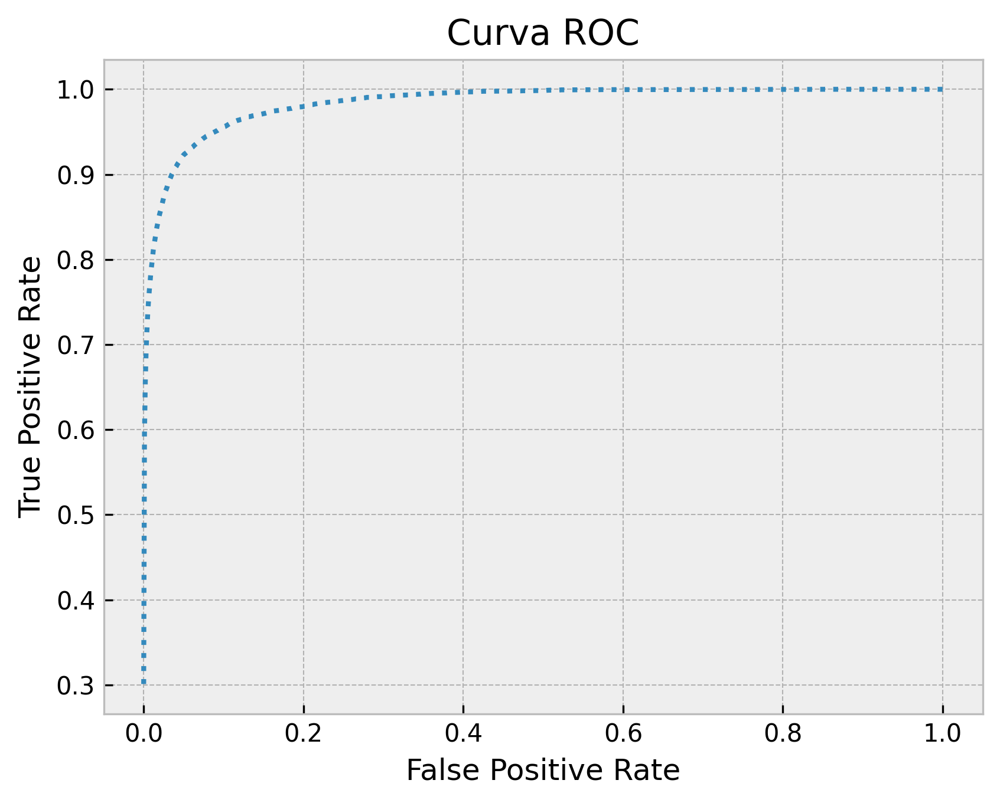

In [25]:
helper.displayAndSaveROC(trainY, testY, predict2, pathMLP, nameMLP)

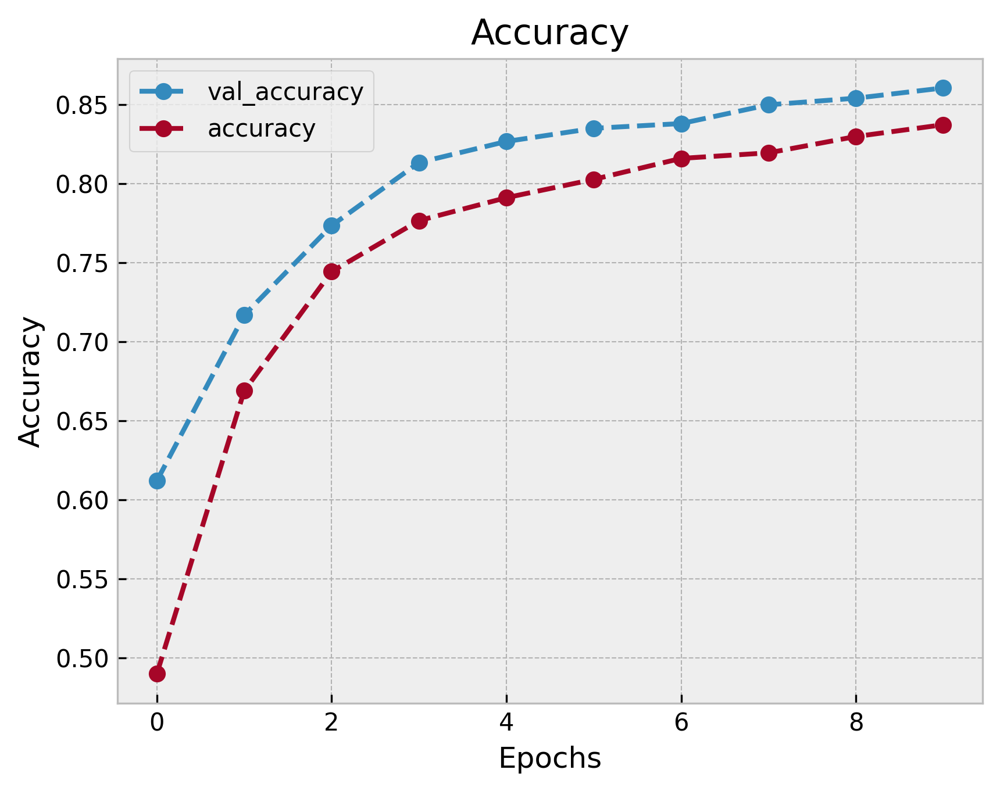

In [26]:
helper.plotAndSaveAcc(history2, pathMLP, nameMLP)

In [27]:
helper.saveData(modelMLP, f1Macro2, areaROC2, history2, pathMLP, nameMLP)

In [28]:
submission = pd.DataFrame()
data = np.load('Data/test_images.npy')/255
submission['id'] = np.arange(len(data))
submission['Category'] = np.argmax(modelMLP.predict(data), (1))
submission.to_csv('submission.csv', index=False)

313/313 [==============================] - 2s 7ms/step


## Visualizando la separacion

In [29]:
capa2 = load_model('Redes guardadas/capa2.h5')
capa2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dropout_4 (Dropout)         (None, 784)               0         
                                                                 
 batch_normalization_4 (Batc  (None, 784)              3136      
 hNormalization)                                                 
                                                                 
 dense_5 (Dense)             (None, 1000)              785000    
                                                                 
 dropout_5 (Dropout)         (None, 1000)              0         
                                                                 
 batch_normalization_5 (Batc  (None, 1000)             4000      
 hNormalization)                                      

In [30]:
act='relu'

modelc2 = Sequential()
modelc2.add(Flatten(input_shape=(28, 28)))
modelc2.add(Dropout(0.3))
modelc2.add(BatchNormalization(synchronized=True))
modelc2.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelc2.add(Dropout(0.3))
modelc2.add(BatchNormalization(synchronized=True))
modelc2.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelc2.add(Dropout(0.3))
modelc2.add(BatchNormalization(synchronized=True))
modelc2.add(Dense(1000, activation=act, kernel_initializer=GlorotNormal(seed=1)))#LeakyReLU(alpha=0.05)))#, kernel_regularizer=l2(0.0001), bias_regularizer=l2(0.0001) ))
modelc2.add(Dropout(0.3))
modelc2.add(BatchNormalization(synchronized=True))
modelc2.add(Dense(2, activation='linear'))
modelc2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 784)               0         
                                                                 
 dropout_4 (Dropout)         (None, 784)               0         
                                                                 
 batch_normalization_4 (Batc  (None, 784)              3136      
 hNormalization)                                                 
                                                                 
 dense_6 (Dense)             (None, 1000)              785000    
                                                                 
 dropout_5 (Dropout)         (None, 1000)              0         
                                                                 
 batch_normalization_5 (Batc  (None, 1000)             4000      
 hNormalization)                                      

In [31]:
for layer, layer2 in zip(modelc2.layers, capa2.layers):
    layer.set_weights(layer2.get_weights())   

In [32]:
modelc2.compile(loss="categorical_crossentropy", optimizer=Adamax(learning_rate=0.002), metrics=["accuracy", Precision(), Recall()])

In [33]:
outputc2 = modelc2.predict(data)

313/313 [==============================] - 3s 8ms/step


In [34]:
modelout = Sequential()

modelout.add(Input(shape=(2,)))
modelout.add(Dense(10, activation='softmax'))

modelout.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 10)                30        
                                                                 
Total params: 30
Trainable params: 30
Non-trainable params: 0
_________________________________________________________________


In [35]:
modelout.compile(loss="categorical_crossentropy", optimizer=Adamax(learning_rate=0.002), metrics=["accuracy", Precision(), Recall()])

In [14]:
modelout.layers[0].set_weights(capa2.layers[-1].get_weights()) 

In [15]:
range_nums = np.arange(-30000, 30000, 500)

x, y = np.meshgrid(range_nums, range_nums)

combinations = np.column_stack((x.flatten(), y.flatten()))

In [16]:
outputOut = modelout.predict(combinations)

450/450 [==============================] - 1s 1ms/step


In [17]:
helper.plotSeparate2D(outputOut, outputc2, combinations, labelsNp, clases)

## Variación de hyperparametros

Se variaron los hyperparametros del modelo modelVar. Uno a la vez.

In [15]:
modelVar = load_model('Redes guardadas/base.h5')
modelVar.summary()

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_22 (Flatten)        (None, 784)               0         
                                                                 
 dropout_78 (Dropout)        (None, 784)               0         
                                                                 
 batch_normalization_74 (Bat  (None, 784)              3136      
 chNormalization)                                                
                                                                 
 dense_77 (Dense)            (None, 1000)              785000    
                                                                 
 dropout_79 (Dropout)        (None, 1000)              0         
                                                                 
 batch_normalization_75 (Bat  (None, 1000)             4000      
 chNormalization)                                    

Al medir la accuracy contra los distintos hyperparametros varias cosas pueden notarse. En todos los casos se entrenaron la misma cantidad de epochs. 

Primero se ve la efectividad de la relu frente a las otras funciones de activacion, ademas de la efectividad de Adam y sus variantes frente a otros optimizadores. La normalizacion de batches permite una mayor accuracy ya que vuelve mas rapido el entrenamiento, probablemente a mayores epochs se encontrarian valores similares de accuracy para el modelo sin normalizacion. 

Parece ser que 128 es un buen valor de batchsize, este siendo un buen compromiso entre valores que generan mayor ruido y otros que utilizan mas datos.

0.3 parece ser un buen valor de dropout ya que se encuentran iguales las accuracy de training y de validacion por lo que no encontramos ni overfitting ni underfitting.

Por ultimoes vizible como inicalizar los pesos en cero genera esperablemente que la red no entrene, mientras qeu los pesos constantes dan un mal valor de accuracy. Las mejores variantes parecen ser las glorot.

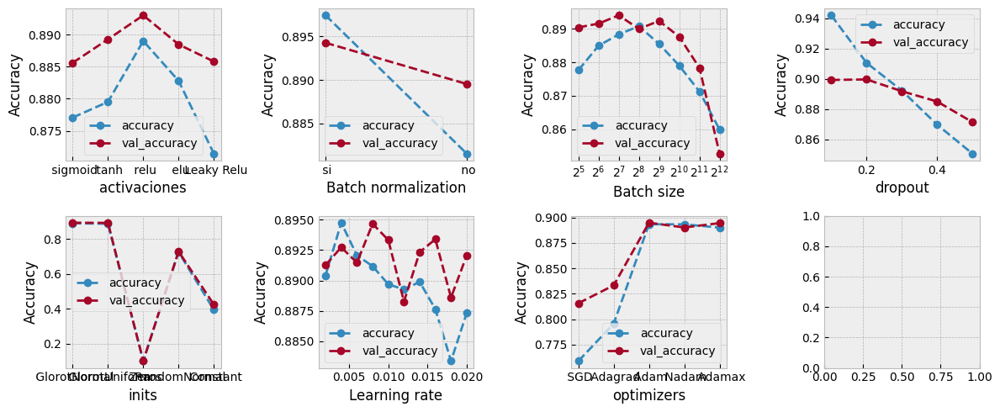

In [3]:
helper.plotVarHyperAcc()

Mirando las iteraciones necesarias para llegar a un valor estable, se ve primero la mayor velocidad del batch normalization, ademas de la mayor velocidad de las variantes de adam. 

Esperablemente se ve como a mayores batch size, mas rapido es el entrenamiento dado la mayor cantidad de datos por iteracion.


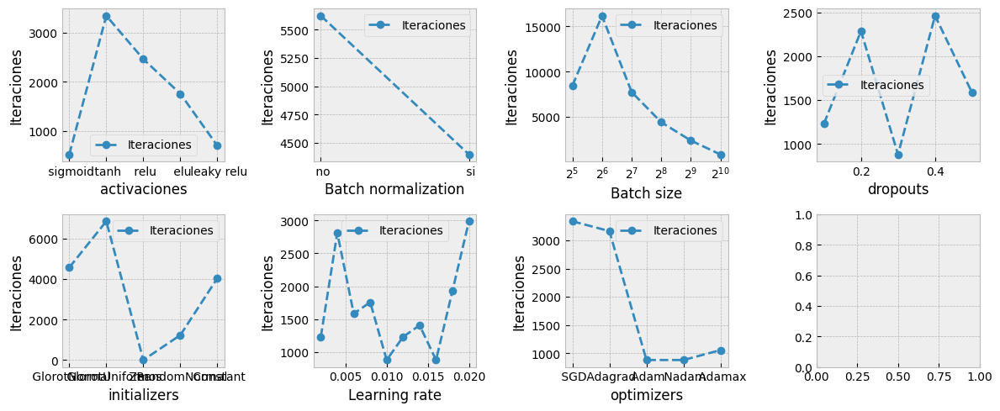

In [4]:
helper.plotVarHyperIter()

## Resultados notables

#### Softmax

In [ ]:
from IPython.display import IFrame
IFrame("Modelos/Softmax/simple3.pdf", width=600, height=300)

## Lottery ticket

In [9]:
model1 = load_model('Red1.h5')

In [10]:
pred =  model1.predict(testX)

469/469 [==============================] - 4s 7ms/step


In [11]:
import tensorflow as tf

argmx = [np.argmax(p) for p in pred]    
arr = np.array(argmx)


m = tf.keras.metrics.Accuracy()
m.update_state(arr, testY)
m.result().numpy()


0.09593333

In [12]:
model2 = load_model('Red2.h5')

In [13]:
pred2 =  model2.predict(testX)

469/469 [==============================] - 4s 8ms/step


In [14]:
argmx2 = [np.argmax(p) for p in pred2]    
arr2 = np.array(argmx2)


n = tf.keras.metrics.Accuracy()
n.update_state(arr2, testY)
n.result().numpy()

0.89433336

In [15]:
 model1.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_4 (Flatten)         (None, 784)               0         
                                                                 
 dropout_16 (Dropout)        (None, 784)               0         
                                                                 
 dense_16 (Dense)            (None, 1000)              785000    
                                                                 
 dropout_17 (Dropout)        (None, 1000)              0         
                                                                 
 dense_17 (Dense)            (None, 1000)              1001000   
                                                                 
 dropout_18 (Dropout)        (None, 1000)              0         
                                                                 
 dense_18 (Dense)            (None, 1000)             

In [16]:
model1.layers[8].get_weights()[1].shape

(10,)

In [18]:
model3 = load_model('Red1.h5')

In [19]:
from helper import elim50



for idx, layer in enumerate(model3.layers):

    if not idx%2 and idx:
        bshape = model1.layers[idx].get_weights()[1].shape
        if idx != 8:
            layer.set_weights([elim50(model1.layers[idx].get_weights()[0], model2.layers[idx].get_weights()[0]), np.zeros(bshape)])


In [20]:
pred3 = model3.predict(testX)

469/469 [==============================] - 3s 7ms/step


In [21]:
#model3.layers[2].get_weights()[0]

In [22]:
argmx3 = [np.argmax(p) for p in pred3]    
arr3 = np.array(argmx3)


o = tf.keras.metrics.Accuracy()
o.update_state(arr3, testY)
o.result().numpy()

0.1198